In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
from scipy import stats
from matplotlib.gridspec import GridSpec

In [3]:
def unique_non_null(s):
    return s.dropna().unique()

In [4]:
def get_color(color):
    if color == "Pittsburgh":
        return "#003594"
    elif color == "Miami FL":
        return "#F47321"
    elif color == "Duke":
        return "#003087"
    elif color == "Notre Dame":
        return "#c99700"
    elif color == "Louisville":
        return "#AD0000"
    elif color == "Georgia Tech":
        return "#B3A369"
    elif color == "Florida St.":
        return "#782F40"
    elif color == "Syracuse":
        return "#F76900"
    elif color == "North Carolina":
        return "#7BAFD4"
    elif color == "North Carolina St.":
        return "#CC0000"
    elif color == "Virginia":
        return "#F84C1E"
    elif color == "Virginia Tech":
        return "#630031"
    elif color == "Wake Forest":
        return "#9E7E38"
    elif color == "Boston College":
        return "#98002E"
    elif color == "Clemson":
        return "#522D80"
    elif color == "Villanova":
        return "#00205b"
    elif color == "Connecticut":
        return "#7C878E"
    elif color == "Baylor":
        return "#154734"
    elif color == "Kansas":
        return "#E8000D"

In [5]:
path = "./cbb.csv"
df = pd.read_csv(path)
df.head()

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,30.4,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,...,22.4,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,...,30.0,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,...,36.6,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,...,26.9,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017


In [6]:
df.columns

Index(['TEAM', 'CONF', 'G', 'W', 'ADJOE', 'ADJDE', 'BARTHAG', 'EFG_O', 'EFG_D',
       'TOR', 'TORD', 'ORB', 'DRB', 'FTR', 'FTRD', '2P_O', '2P_D', '3P_O',
       '3P_D', 'ADJ_T', 'WAB', 'POSTSEASON', 'SEED', 'YEAR'],
      dtype='object')

In [7]:
# Add win percentage col
df['WPRCT'] = df['W']/df['G']
df

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,0.825000
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,...,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015,0.900000
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,...,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018,0.825000
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,...,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019,0.815789
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,...,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017,0.948718
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3880,Stonehill,NEC,30,4,90.3,114.2,0.0629,46.7,52.7,19.5,...,47.9,51.7,30.1,35.9,68.1,-22.0,NaN,NaN,2024,0.133333
3881,St. Francis PA,NEC,28,8,93.1,118.1,0.0608,47.2,53.0,21.2,...,45.7,52.9,33.2,35.4,65.4,-18.6,NaN,NaN,2024,0.285714
3882,IUPUI,Horz,29,6,92.1,116.9,0.0607,46.5,58.2,21.3,...,49.5,59.0,24.7,38.0,67.3,-21.6,NaN,NaN,2024,0.206897
3883,Coppin St.,MEAC,29,2,85.1,111.1,0.0445,42.1,51.3,22.9,...,41.9,51.0,28.3,34.5,66.3,-22.9,NaN,NaN,2024,0.068966


In [8]:
acc = df[df['CONF'] == 'ACC']
acc = acc[acc['TEAM'] != 'Maryland']
acc.head()

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,0.825000
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,...,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,0.897436
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,...,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,0.921053
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,...,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,0.846154
14,Louisville,ACC,36,27,109.4,87.4,0.9290,47.7,44.0,17.2,...,48.4,43.3,30.7,30.3,65.6,5.8,E8,4.0,2015,0.750000


In [9]:
unique_non_null(acc['POSTSEASON'])

array(['2ND', 'Champions', 'E8', 'F4', 'R32', 'R64', 'R68', 'S16'],
      dtype=object)

In [10]:
acc.sort_values('YEAR')

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
2348,North Carolina St.,ACC,35,24,115.2,98.0,0.8650,54.2,46.8,18.0,...,52.8,47.5,39.1,30.2,68.1,2.2,R64,8.0,2013,0.685714
1765,Wake Forest,ACC,31,13,99.6,96.5,0.5916,48.5,50.8,20.7,...,47.1,49.5,34.5,35.9,69.2,-7.5,NaN,NaN,2013,0.419355
1764,Clemson,ACC,31,13,99.2,93.7,0.6571,47.2,46.8,18.4,...,47.1,44.4,31.7,34.8,62.3,-7.7,NaN,NaN,2013,0.419355
1819,Boston College,ACC,33,16,108.6,102.0,0.6737,51.0,51.1,17.7,...,49.7,48.7,35.3,37.5,64.2,-5.4,NaN,NaN,2013,0.484848
39,Duke,ACC,36,30,118.4,91.5,0.9507,53.9,45.5,15.6,...,50.8,46.2,39.9,29.0,67.8,7.5,E8,2.0,2013,0.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3536,Duke,ACC,32,24,120.8,96.8,0.9272,55.2,49.0,14.3,...,54.4,49.1,37.7,32.6,66.9,3.3,E8,4.0,2024,0.750000
3526,North Carolina,ACC,34,27,116.8,93.2,0.9305,51.3,46.4,14.4,...,50.3,46.0,35.4,31.4,70.4,6.6,S16,1.0,2024,0.794118
3663,Notre Dame,ACC,33,13,101.9,98.2,0.6052,47.6,48.2,19.1,...,47.5,47.8,31.8,32.5,64.2,-7.8,NaN,NaN,2024,0.393939
3595,Pittsburgh,ACC,33,22,115.8,98.9,0.8600,51.6,49.0,13.4,...,50.0,50.8,35.7,30.8,65.8,0.3,NaN,NaN,2024,0.666667


In [11]:
df[df['TEAM'] == 'Pittsburgh']

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
117,Pittsburgh,ACC,33,18,113.2,101.7,0.7749,49.1,50.0,15.7,...,48.6,49.0,33.6,34.9,60.9,-1.5,NaN,NaN,2015,0.545455
133,Pittsburgh,ACC,33,16,112.7,101.2,0.7754,51.4,51.3,17.6,...,49.6,50.2,36.1,35.6,67.0,-2.0,NaN,NaN,2017,0.484848
139,Pittsburgh,ACC,32,8,98.2,103.3,0.3571,48.2,50.1,20.9,...,47.8,50.1,32.5,33.4,66.5,-10.9,NaN,NaN,2018,0.250000
147,Pittsburgh,ACC,33,14,103.3,98.2,0.6421,47.9,47.7,19.6,...,46.9,45.8,33.1,33.6,68.7,-6.3,NaN,NaN,2019,0.424242
2126,Pittsburgh,ACC,36,26,117.1,94.0,0.9261,50.7,46.7,16.3,...,50.1,45.5,35.1,32.6,63.8,4.1,R32,9.0,2014,0.722222
2156,Pittsburgh,ACC,32,20,113.9,96.9,0.8659,51.1,50.0,17.5,...,50.4,48.4,35.0,35.4,66.3,1.8,R64,10.0,2016,0.625000
2347,Pittsburgh,BE,33,24,112.8,91.1,0.9217,51.7,44.6,18.1,...,51.5,44.0,34.9,30.4,60.3,3.1,R64,8.0,2013,0.727273
2648,Pittsburgh,ACC,22,10,107.9,100.0,0.7062,48.8,50.0,18.3,...,47.8,51.1,33.9,32.3,68.7,-4.0,NaN,NaN,2021,0.454545
3002,Pittsburgh,ACC,32,11,98.9,101.1,0.4379,46.7,52.0,21.2,...,46.5,49.5,31.4,36.8,64.0,-8.9,NaN,NaN,2022,0.343750
3200,Pittsburgh,ACC,36,24,113.1,101.6,0.7743,52.5,48.5,16.3,...,51.4,48.2,36.0,32.6,67.2,-0.3,R32,11.0,2023,0.666667


In [12]:
teams = acc["TEAM"].unique()
teams

array(['North Carolina', 'Duke', 'Virginia', 'Louisville', 'Notre Dame',
       'Florida St.', 'Syracuse', 'Boston College', 'Clemson',
       'Georgia Tech', 'Miami FL', 'Pittsburgh', 'Virginia Tech',
       'Wake Forest', 'North Carolina St.'], dtype=object)

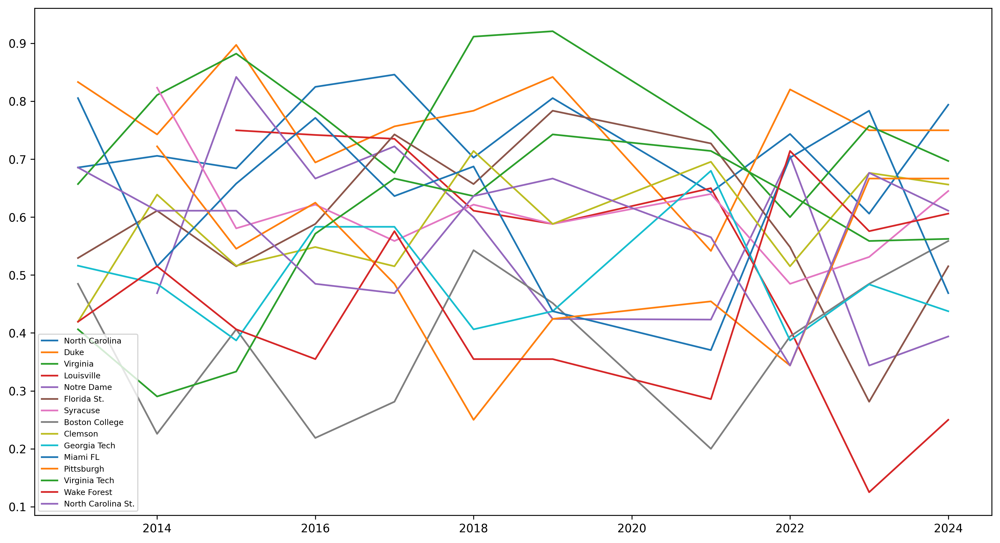

In [13]:
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

# Simple Graph
stat = 'WPRCT'

teams = acc["TEAM"].unique()
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    ax.plot(x, y, label = team)

ax.legend(loc="lower left", fontsize='x-small')

In [14]:
# Delta BARTHAG or other stat
stat = 'BARTHAG'
vars = []


teams = acc["TEAM"].unique()
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    vars.append(team_stats[stat].max() - team_stats[stat].min())

df_stat_var = pd.DataFrame({'TEAM' : teams, 
                            stat : vars})

acc_ordered_mean = df_stat_var.sort_values('BARTHAG', ascending=True)

In [15]:
# Thin out teams with less variance for now, not a final decision
df_stat_var = df_stat_var[df_stat_var['BARTHAG'] >= 0.3]
df_stat_var

,TEAM,BARTHAG
3,Louisville,0.6554
4,Notre Dame,0.3658
5,Florida St.,0.5006
6,Syracuse,0.3293
7,Boston College,0.3607
9,Georgia Tech,0.3133
10,Miami FL,0.3356
11,Pittsburgh,0.5690
12,Virginia Tech,0.4153
13,Wake Forest,0.3744


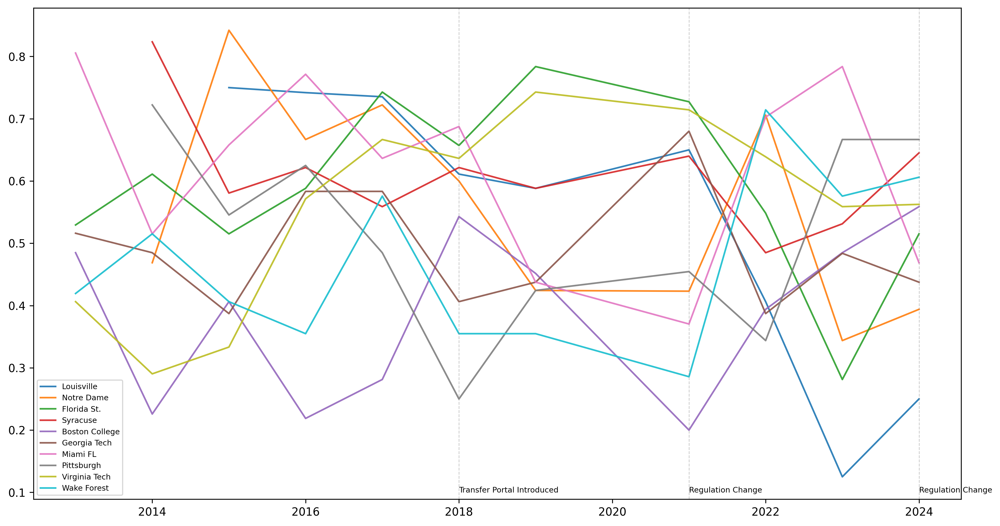

In [16]:
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

# Simple Graph
stat = 'WPRCT'
# teams = acc["TEAM"].unique()
teams = df_stat_var['TEAM'].unique()

cmap = plt.colormaps["tab10"]

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if (df_stat_var['TEAM'] == team).any():
        a = 0.9
    else:
        a = 0.0
    ax.plot(x, y, label = team, alpha=a, color=cmap(n))
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='x-small')

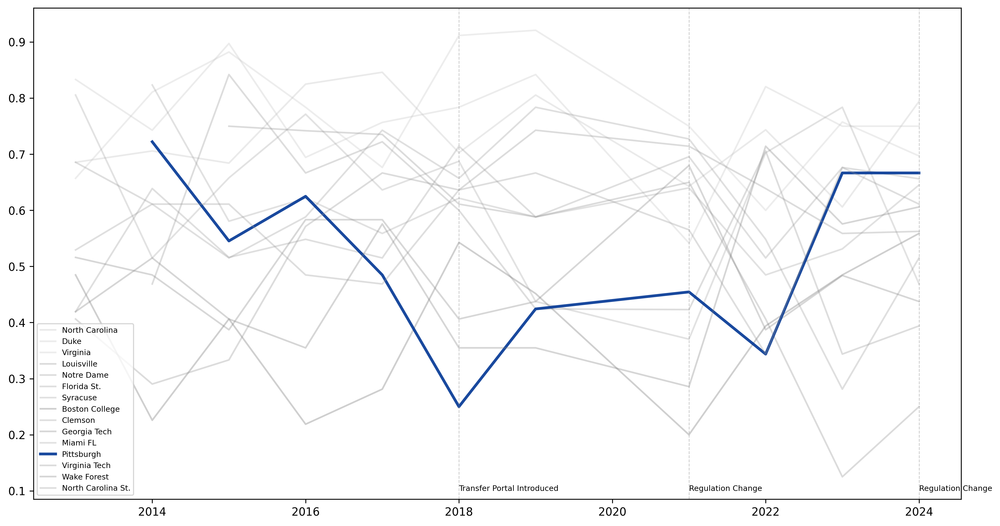

In [17]:
# Focus Team: Pittsburgh, grey out the rest

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team == 'Pittsburgh':
        ax.plot(x, y, label = team, alpha=0.9, color='#003594', lw=2.5)
    else:
        ax.plot(x, y, label = team, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='x-small')

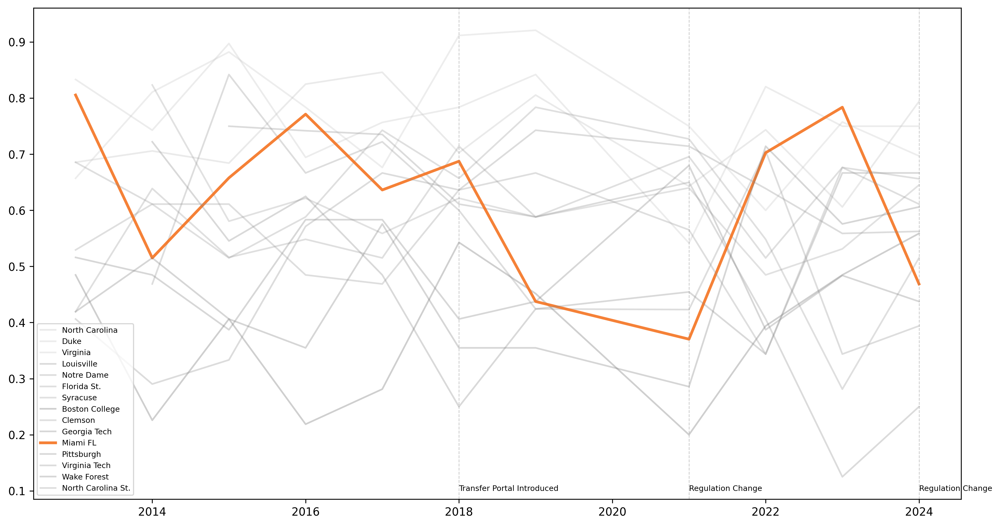

In [18]:
# Focus Team: Miami, grey out the rest

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team == 'Miami FL':
        ax.plot(x, y, label = team, alpha=0.9, color='#F47321', lw=2.5)
    else:
        ax.plot(x, y, label = team, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='x-small')

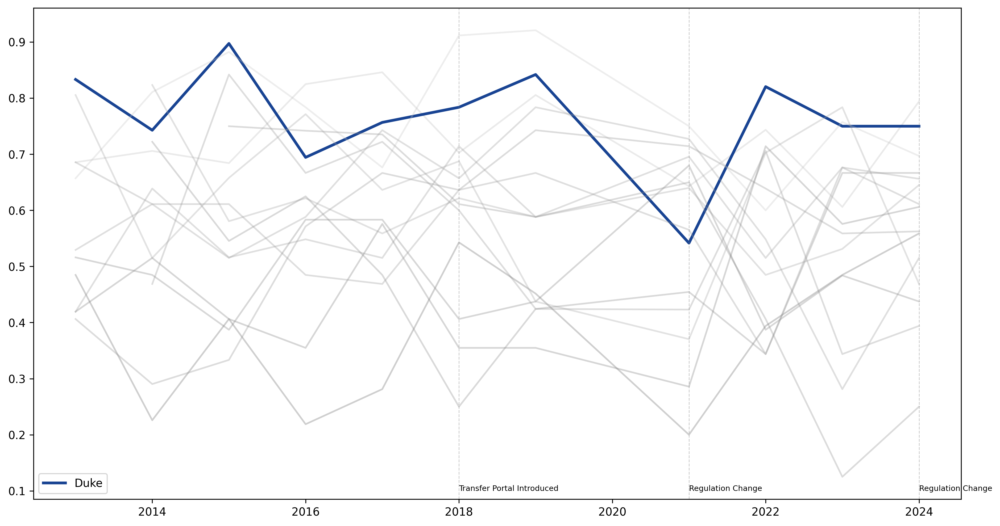

In [19]:
# Focus Team: Duke, grey out the rest

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team == 'Duke':
        ax.plot(x, y, label = team, alpha=0.9, color='#003087', lw=2.5)
    else:
        ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='medium')

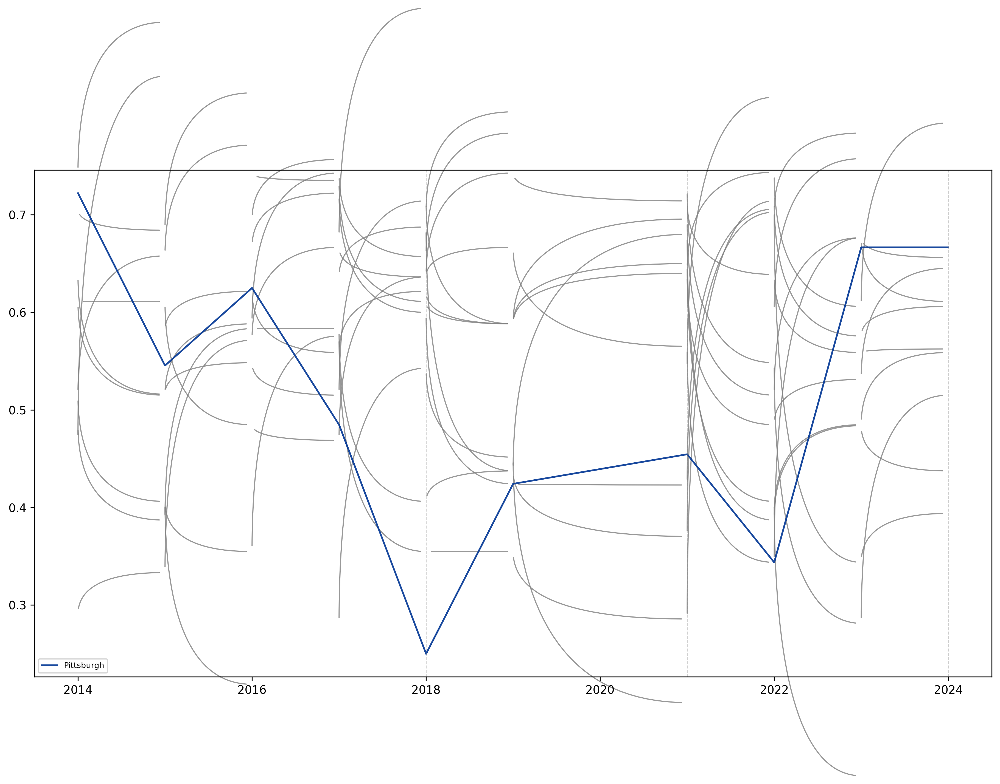

In [20]:
# Focus Graph with Smoothed Lines

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team == 'Pittsburgh':
        ax.plot(x, y, label = team, alpha=0.9, color='#003594')
    else:
        # Get 2d array of [stat, YEAR]
        posG = team_stats[['YEAR', stat]].to_numpy()
        i = 0
        j = 1
        while j < len(posG):
            xi,yi=posG[i]
            xj,yj=posG[j]
            plt.annotate("",
                        xy=(xi, yi), xycoords='data',
                        xytext=(xj, yj), textcoords='data',
                        arrowprops=dict(arrowstyle="-", #linestyle="dashed",
                                        color=".5",
                                        alpha=0.8,
                                        shrinkA=5, shrinkB=5,
                                        patchA=None,
                                        patchB=None,
                                        connectionstyle='angle3,angleA=0,angleB=270',
                                        ),zorder=1
                        )
            i += 1
            j += 1
        # ax.plot(x, y, label = team, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='x-small')

In [21]:
def gaussian_smooth(x, y, grid, sd):
    weights = np.transpose([stats.norm.pdf(grid, m, sd) for m in x])
    weights = weights / weights.sum(0)
    return (weights * y).sum(1)

ValueError: Length of values (500) does not match length of index (11)

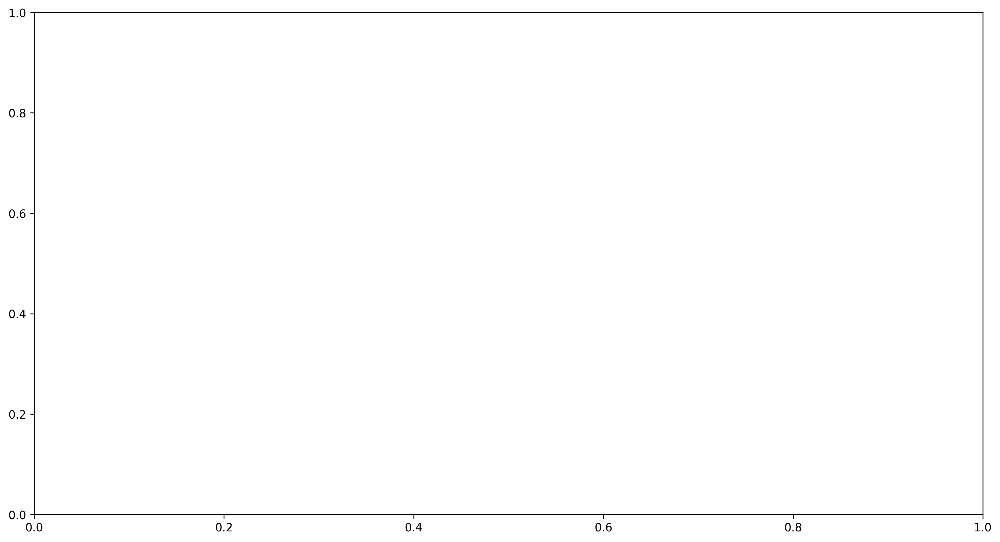

In [22]:
# Focus Team: Duke, grey out the rest

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    grid = np.linspace(min(x), max(x), num=500)
    y_smoothed = gaussian_smooth(x, y, grid, 1)
    if team == 'Duke':
        ax.plot(x, y_smoothed, label = team, alpha=0.9, color='#003087', lw=2.5)
    else:
        ax.plot(x, y_smoothed, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='medium')

### Notes

Need to add scatter plot points which the edges are connecting, or go to the exact spot.
There may be some math involving 3 points to generate a smooth curve at each point. Like a piecewise function from the half year mark to the next. 

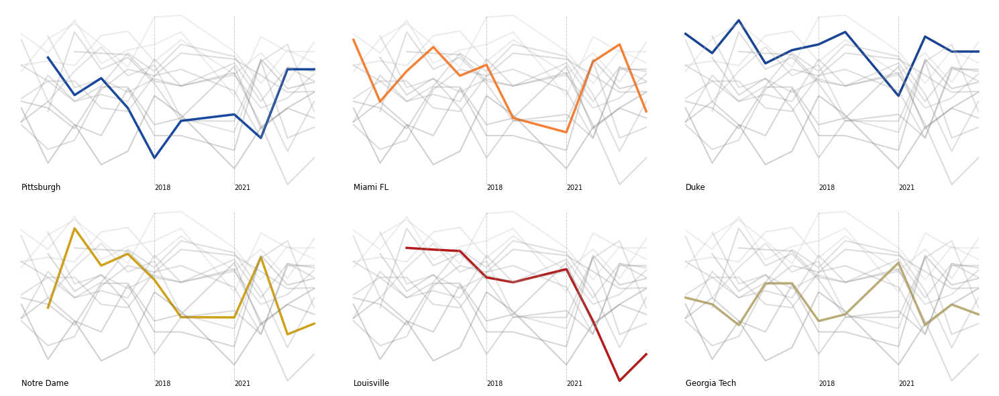

In [23]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
teams = acc["TEAM"].unique()

height = 5
fig, axes = plt.subplots(2, 3, figsize=(15, 6))

SLICES = [(i, j) for i in range(2) for j in range(3)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    focus = focus_teams[i]

    cmap = plt.colormaps['gray']

    n = 0
    for team in teams:
        team_stats = acc[acc['TEAM'] == team]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        if team == focus:
            ax.plot(x, y, label = team, alpha=0.9, color=colors[i], lw=2.5)
        else:
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

    ax.annotate("2018", xy=(2018, 0.1), fontsize='x-small')
    ax.annotate("2021", xy=(2021, 0.1), fontsize='x-small')
    ax.annotate(focus, xy=(2013, 0.1), fontsize="small")
    i+=1


plt.tight_layout()
plt.show()
    

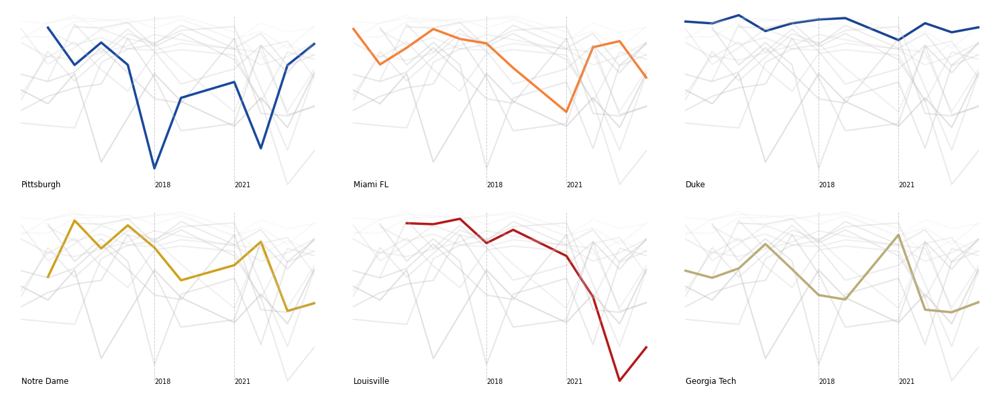

In [24]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'BARTHAG'
teams = acc["TEAM"].unique()

fig, axes = plt.subplots(2, 3, figsize=(15, 6))

SLICES = [(i, j) for i in range(2) for j in range(3)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    focus = focus_teams[i]

    cmap = plt.colormaps['gray']

    n = 0
    for team in teams:
        team_stats = acc[acc['TEAM'] == team]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        if team == focus:
            ax.plot(x, y, label = team, alpha=0.9, color=colors[i], lw=2.5)
        else:
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

    ax.annotate("2018", xy=(2018, 0.28), fontsize='x-small')
    ax.annotate("2021", xy=(2021, 0.28), fontsize='x-small')
    ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
    i+=1


plt.tight_layout()
plt.show()
    

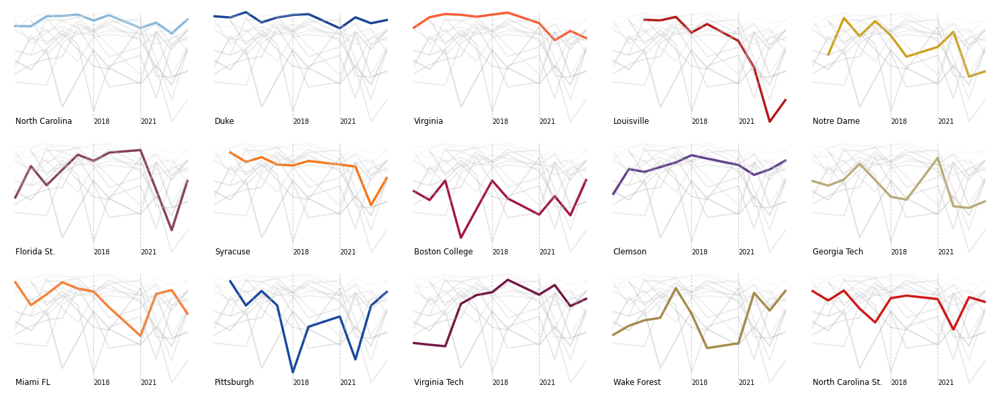

In [413]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'BARTHAG'
teams = acc["TEAM"].unique()

fig, axes = plt.subplots(3, 5, figsize=(15, 6))

SLICES = [(i, j) for i in range(3) for j in range(5)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    focus = teams[i]

    cmap = plt.colormaps['gray']

    n = 0
    for team in teams:
        team_stats = acc[acc['TEAM'] == team]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        if team == focus:
            ax.plot(x, y, label = team, alpha=0.9, color=get_color(team), lw=2.5)
        else:
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

    ax.annotate("2018", xy=(2018, 0.28), fontsize='x-small')
    ax.annotate("2021", xy=(2021, 0.28), fontsize='x-small')
    ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
    # ax.set_title(focus)
    i+=1


plt.tight_layout()
plt.show()
    

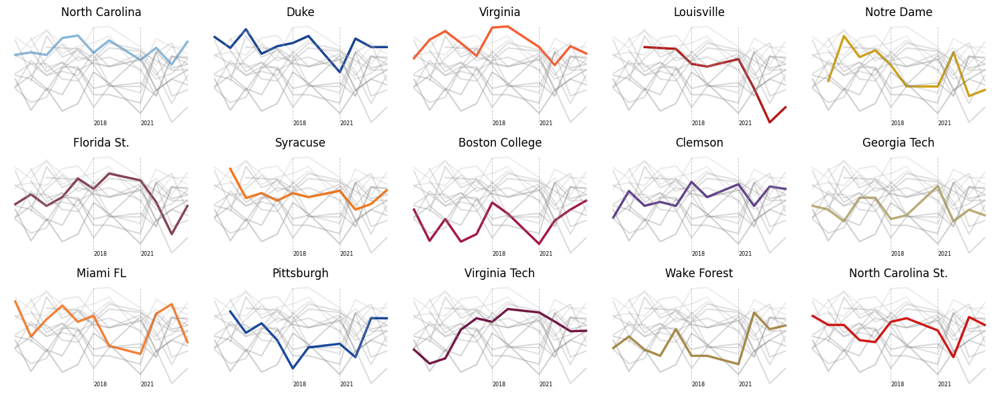

In [25]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
teams = acc["TEAM"].unique()

fig, axes = plt.subplots(3, 5, figsize=(15, 6))

SLICES = [(i, j) for i in range(3) for j in range(5)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    focus = teams[i]

    cmap = plt.colormaps['gray']

    n = 0
    for team in teams:
        team_stats = acc[acc['TEAM'] == team]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        if team == focus:
            ax.plot(x, y, label = team, alpha=0.9, color=get_color(team), lw=2.5)
        else:
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

    ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
    ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
    # ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
    ax.set_title(focus)
    i+=1


plt.tight_layout()
plt.show()
    

In [26]:
teams = ["Pittsburgh", "Pittsburgh", "Duke", "North Carolina", "North Carolina St.", "Boston College", "Louisville", "Louisville", "Louisville", "Virginia Tech", "Virginia Tech", "Notre Dame", "Georgia Tech", "Georgia Tech", "Wake Forest"]
years = [2016, 2018, 2022, 2021, 2017, 2021, 2017, 2018, 2022, 2015, 2020, 2023, 2016, 2023, 2021]
coaching_changes = pd.DataFrame()

coaching_changes['TEAM'] = teams
coaching_changes['YEAR'] = years
coaching_changes

,TEAM,YEAR
0,Pittsburgh,2016
1,Pittsburgh,2018
2,Duke,2022
3,North Carolina,2021
4,North Carolina St.,2017
5,Boston College,2021
6,Louisville,2017
7,Louisville,2018
8,Louisville,2022
9,Virginia Tech,2015


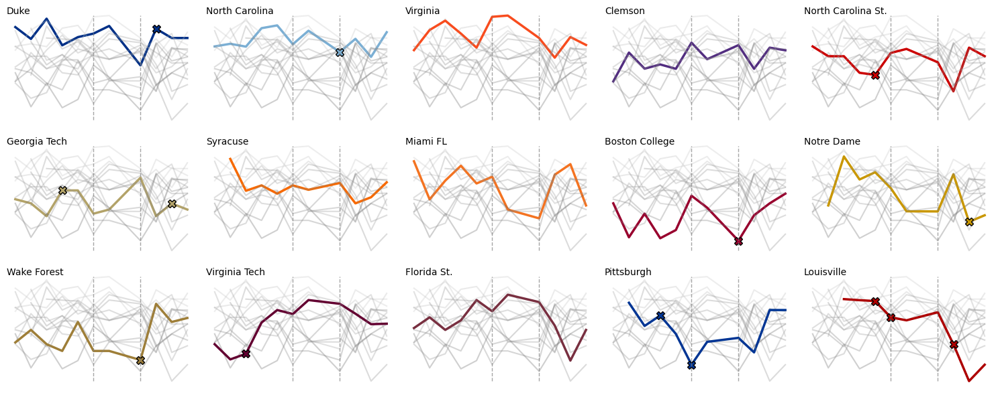

In [27]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
# teams = acc["TEAM"].unique()

# Left to right, top to bottom teams are ordered by difference between max and min power rating
teams = acc_ordered_mean["TEAM"].unique()
# teams = ["Miami FL", "North Carolina", "North Carolina St.", "Florida St.", "Boston College", "Virginia", "Pittsburgh", "Louisville", "Wake Forest", "Virginia Tech", "Syracuse", "Georgia Tech", "Notre Dame", "Duke", "Clemson"]
# teams = ["Duke", "North Carolina", "Virginia", "Virginia Tech", "Miami FL", "Wake Forest", "Boston College", "Notre Dame", "North Carolina St.", "Pittsburgh", "Clemson", "Syracuse", "Georgia Tech", "Florida St.", "Louisville"]

fig, axes = plt.subplots(3, 5, figsize=(15, 6))

SLICES = [(i, j) for i in range(3) for j in range(5)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    cmap = plt.colormaps['gray']
    if i >= 15:
        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))
            ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
            ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
    else: 
        focus = teams[i]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team == focus:
                ax.plot(x, y, label = team, alpha=1, color=get_color(team), lw=2.5)
            else:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

        # ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
        # ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
        # ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
    i+=1


# Legend Creation
# cross = mlines.Line2D([], [], color='white', marker='X', linestyle='None',
#                           markersize=8, markeredgecolor='black', label='Coaching Change')
# fig.legend(handles=[cross], loc='lower right', fontsize='small')

#plt.title("Changes in ACC Power Ratings Over Time")

plt.tight_layout()
plt.show()
    

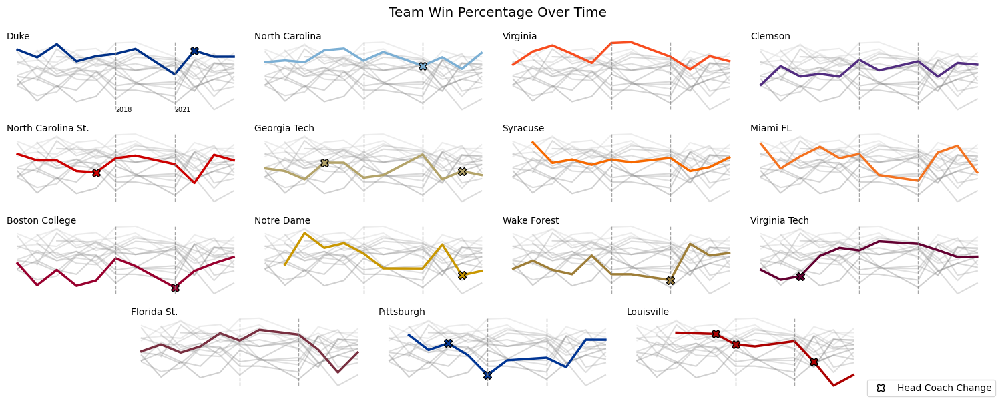

In [28]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
# teams = acc["TEAM"].unique()

# Left to right, top to bottom teams are ordered by difference between max and min power rating
teams = acc_ordered_mean["TEAM"].unique()
# teams = ["Miami FL", "North Carolina", "North Carolina St.", "Florida St.", "Boston College", "Virginia", "Pittsburgh", "Louisville", "Wake Forest", "Virginia Tech", "Syracuse", "Georgia Tech", "Notre Dame", "Duke", "Clemson"]
# teams = ["Duke", "North Carolina", "Virginia", "Virginia Tech", "Miami FL", "Wake Forest", "Boston College", "Notre Dame", "North Carolina St.", "Pittsburgh", "Clemson", "Syracuse", "Georgia Tech", "Florida St.", "Louisville"]

fig = plt.figure(figsize=(15, 6))

gs = GridSpec(4, 8, figure=fig)

# SLICES = [(i, j) for i in range(3) for j in range(5)]

k = 0
for i in range(3):
    for j in range(4):
        ax = fig.add_subplot(gs[i, j*2:j*2+2])
        ax.set_axis_off()
        cmap = plt.colormaps['gray']            

        
        focus = teams[k]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team != focus:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        team_stats = acc[acc['TEAM'] == focus]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        ax.plot(x, y, label = focus, alpha=1, color=get_color(focus), lw=2.5)

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)
        bot, top = ax.get_ylim()
        ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        if k == 0:
            ax.annotate("2018", xy=(2018, 0.1), fontsize='x-small')
            ax.annotate("2021", xy=(2021, 0.1), fontsize='x-small')
        k+=1


axes = []
axes.append(fig.add_subplot(gs[3, 1:3]))
axes.append(fig.add_subplot(gs[3, 3:5]))
axes.append(fig.add_subplot(gs[3, 5:7]))

for i in range(3):
    ax = axes[i]
    ax.set_axis_off()
    cmap = plt.colormaps['gray']
    if k >= 15:
        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))
            ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
            ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
    else: 
        focus = teams[k]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team == focus:
                ax.plot(x, y, label = team, alpha=1, color=get_color(team), lw=2.5)
            else:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)
    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    k+=1

cross = mlines.Line2D([], [], color='white', marker='X', linestyle='None',
                          markersize=8, markeredgecolor='black', label='Head Coach Change')
fig.legend(handles=[cross], loc='lower right', fontsize='medium')

fig.suptitle("Team Win Percentage Over Time", fontsize='x-large')

plt.tight_layout()
plt.show()

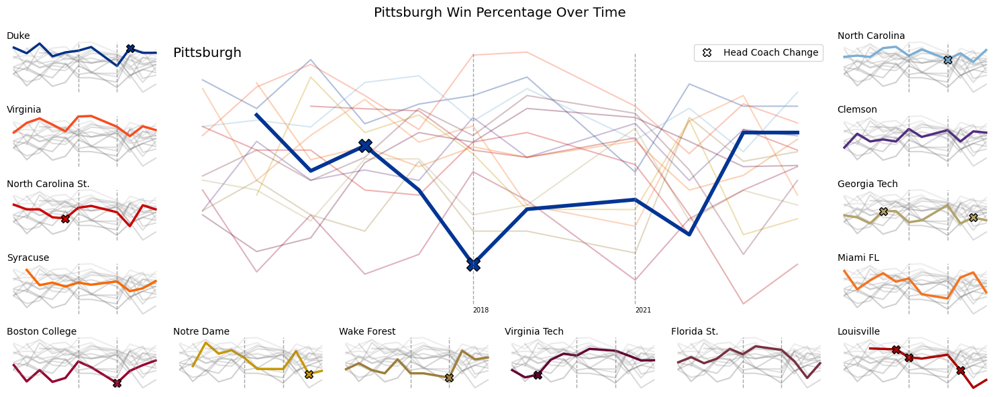

In [64]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
center_team = "Pittsburgh"
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
# teams = acc["TEAM"].unique()

# Left to right, top to bottom teams are ordered by difference between max and min power rating
teams = acc_ordered_mean[acc_ordered_mean["TEAM"] != center_team]['TEAM'].unique()
# teams = ["Miami FL", "North Carolina", "North Carolina St.", "Florida St.", "Boston College", "Virginia", "Pittsburgh", "Louisville", "Wake Forest", "Virginia Tech", "Syracuse", "Georgia Tech", "Notre Dame", "Duke", "Clemson"]
# teams = ["Duke", "North Carolina", "Virginia", "Virginia Tech", "Miami FL", "Wake Forest", "Boston College", "Notre Dame", "North Carolina St.", "Pittsburgh", "Clemson", "Syracuse", "Georgia Tech", "Florida St.", "Louisville"]

fig = plt.figure(figsize=(15, 6))

gs = GridSpec(5, 12, figure=fig)

# SLICES = [(i, j) for i in range(3) for j in range(5)]

k = 0
for i in range(4):
    for j in range(2):
        ax = fig.add_subplot(gs[i, j*10:j*10+2])
        ax.set_axis_off()
        cmap = plt.colormaps['gray']            

        
        focus = teams[k]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team != focus:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        team_stats = acc[acc['TEAM'] == focus]
        team_stats = team_stats.sort_values('YEAR')
        x = team_stats['YEAR']
        y = team_stats[stat]
        ax.plot(x, y, label = focus, alpha=1, color=get_color(focus), lw=2.5)

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)
        bot, top = ax.get_ylim()
        ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        k+=1


""" axes = []
axes.append(fig.add_subplot(gs[3, 1:3]))
axes.append(fig.add_subplot(gs[3, 3:5]))
axes.append(fig.add_subplot(gs[3, 5:7])) """

for i in range(6):
    ax = fig.add_subplot(gs[4, i*2:i*2+2])
    ax.set_axis_off()
    cmap = plt.colormaps['gray']
    if k >= 15:
        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))
            ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
            ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
    else: 
        focus = teams[k]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team == focus:
                ax.plot(x, y, label = team, alpha=1, color=get_color(team), lw=2.5)
            else:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)
    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    k+=1


# Print Main Figure
ax = fig.add_subplot(gs[0:4, 2:10])
ax.set_axis_off()
cmap = plt.colormaps['gray']            


focus = center_team

for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    #ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))
    ax.plot(x, y, alpha=0.3, color=get_color(team))

team_stats = acc[acc['TEAM'] == focus]
team_stats = team_stats.sort_values('YEAR')
x = team_stats['YEAR']
y = team_stats[stat]
ax.plot(x, y, label = focus, alpha=1, color=get_color(focus), lw=4)

focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]

for year in focus_coaches['YEAR']:
    team_stats = acc[acc['TEAM'] == focus]
    for index, row in team_stats.iterrows():
            if row['YEAR'] == year:
                x = row['YEAR']
                y = row[stat]
                ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=15)

ax.set_title(focus, fontsize='x-large', loc='left', y=0.92)
bot, top = ax.get_ylim()
ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.annotate("2018", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("2021", xy=(2021, 0.1), fontsize='x-small')


cross = mlines.Line2D([], [], color='white', marker='X', linestyle='None',
                          markersize=8, markeredgecolor='black', label='Head Coach Change')
ax.legend(handles=[cross], loc='upper right', fontsize='medium')

fig.suptitle(center_team + ' Win Percentage Over Time', fontsize='x-large')

plt.tight_layout()
plt.savefig('finalMainColor.svg')
plt.show()

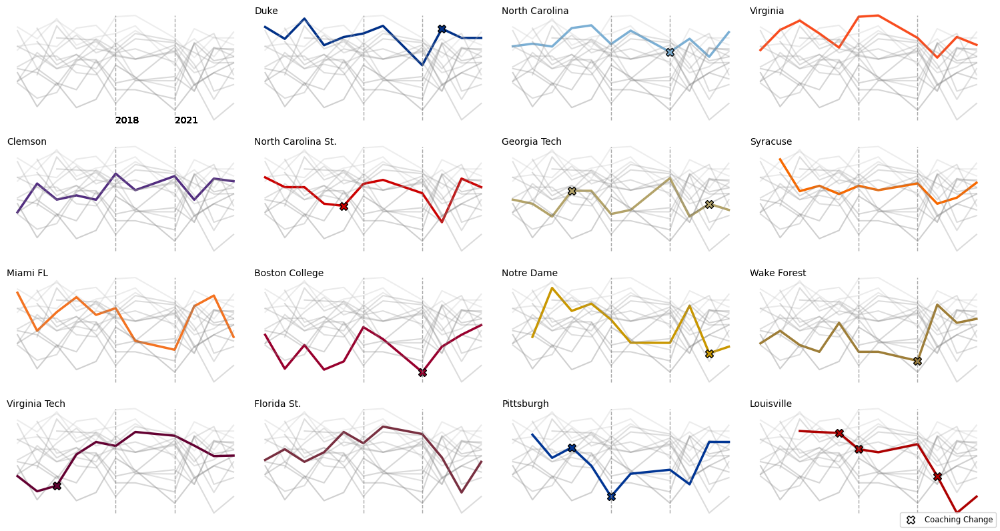

In [30]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
# teams = acc["TEAM"].unique()

# Left to right, top to bottom teams are ordered by difference between max and min power rating
teams = acc_ordered_mean["TEAM"].unique()
# teams = ["Miami FL", "North Carolina", "North Carolina St.", "Florida St.", "Boston College", "Virginia", "Pittsburgh", "Louisville", "Wake Forest", "Virginia Tech", "Syracuse", "Georgia Tech", "Notre Dame", "Duke", "Clemson"]
# teams = ["Duke", "North Carolina", "Virginia", "Virginia Tech", "Miami FL", "Wake Forest", "Boston College", "Notre Dame", "North Carolina St.", "Pittsburgh", "Clemson", "Syracuse", "Georgia Tech", "Florida St.", "Louisville"]

fig, axes = plt.subplots(4, 4, figsize=(15, 8))

SLICES = [(i, j) for i in range(4) for j in range(4)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    cmap = plt.colormaps['gray']
    if i == 0:
        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))
            ax.annotate("2018", xy=(2018, 0.1), fontsize='medium')
            ax.annotate("2021", xy=(2021, 0.1), fontsize='medium')
    else: 
        focus = teams[i-1]

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team == focus:
                ax.plot(x, y, label = team, alpha=1, color=get_color(team), lw=2.5)
            else:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
        
        ax.set_title(focus, fontsize='medium', loc='left', y=0.92)

    bot, top = ax.get_ylim()
    ax.axvline(2018, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
    ax.axvline(2021, color="gray", linestyle="--", linewidth=1, alpha=0.7, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

        # ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
        # ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
        # ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
    i+=1


# Legend Creation
cross = mlines.Line2D([], [], color='white', marker='X', linestyle='None',
                          markersize=8, markeredgecolor='black', label='Coaching Change')
fig.legend(handles=[cross], loc='lower right', fontsize='small')

#plt.title("Changes in ACC Power Ratings Over Time")

plt.tight_layout()
plt.show()
    

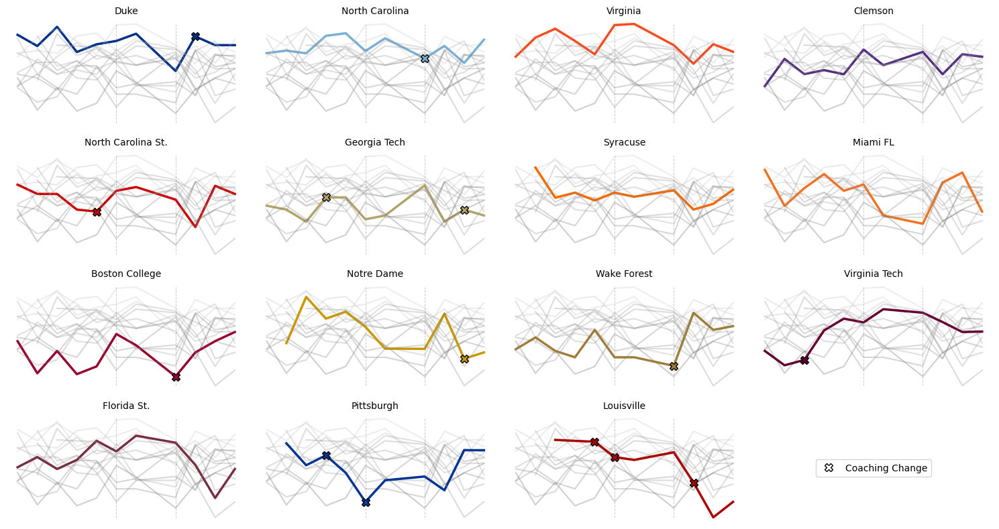

In [31]:
# Multi Plot Visual
focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]
colors = ["#003594", "#F47321", "#003087", "#c99700", "#AD0000", "#B3A369"]
stat = 'WPRCT'
# teams = acc["TEAM"].unique()
teams = acc_ordered_mean["TEAM"].unique()
# teams = ["Miami FL", "North Carolina", "North Carolina St.", "Florida St.", "Boston College", "Virginia", "Pittsburgh", "Louisville", "Wake Forest", "Virginia Tech", "Syracuse", "Georgia Tech", "Notre Dame", "Duke", "Clemson"]
# teams = ["Duke", "North Carolina", "Virginia", "Virginia Tech", "Miami FL", "Wake Forest", "Boston College", "Notre Dame", "North Carolina St.", "Pittsburgh", "Clemson", "Syracuse", "Georgia Tech", "Florida St.", "Louisville"]

fig, axes = plt.subplots(4, 4, figsize=(15, 8))

SLICES = [(i, j) for i in range(4) for j in range(4)]

i = 0
for slice_ in SLICES:
    ax = axes[slice_]
    ax.set_axis_off()
    if i >= 15:
        cross = mlines.Line2D([], [], color='white', marker='X', linestyle='None',
                          markersize=8, markeredgecolor='black', label='Coaching Change')
        ax.legend(handles=[cross], loc='center')
    else: 
        focus = teams[i]

        cmap = plt.colormaps['gray']

        for team in teams:
            team_stats = acc[acc['TEAM'] == team]
            team_stats = team_stats.sort_values('YEAR')
            x = team_stats['YEAR']
            y = team_stats[stat]
            if team == focus:
                ax.plot(x, y, label = team, alpha=1, color=get_color(team), lw=2.5)
            else:
                ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

        focus_coaches = coaching_changes[coaching_changes['TEAM'] == focus]
        
        for year in focus_coaches['YEAR']:
            team_stats = acc[acc['TEAM'] == focus]
            for index, row in team_stats.iterrows():
                    if row['YEAR'] == year:
                        x = row['YEAR']
                        y = row[stat]
                        ax.plot(x, y, marker='X', color=get_color(focus), markeredgecolor='black', ms=8)
            

        bot, top = ax.get_ylim()
        ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
        # ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

        # ax.annotate("2018", xy=(2018, 0.1), fontsize='xx-small')
        # ax.annotate("2021", xy=(2021, 0.1), fontsize='xx-small')
        # ax.annotate(focus, xy=(2013, 0.28), fontsize="small")
        ax.set_title(focus, fontsize='medium')
    i+=1


# Legend Creation

# fig.suptitle("External Influence on the ACC", fontsize='xx-large')

plt.tight_layout()
plt.show()
    

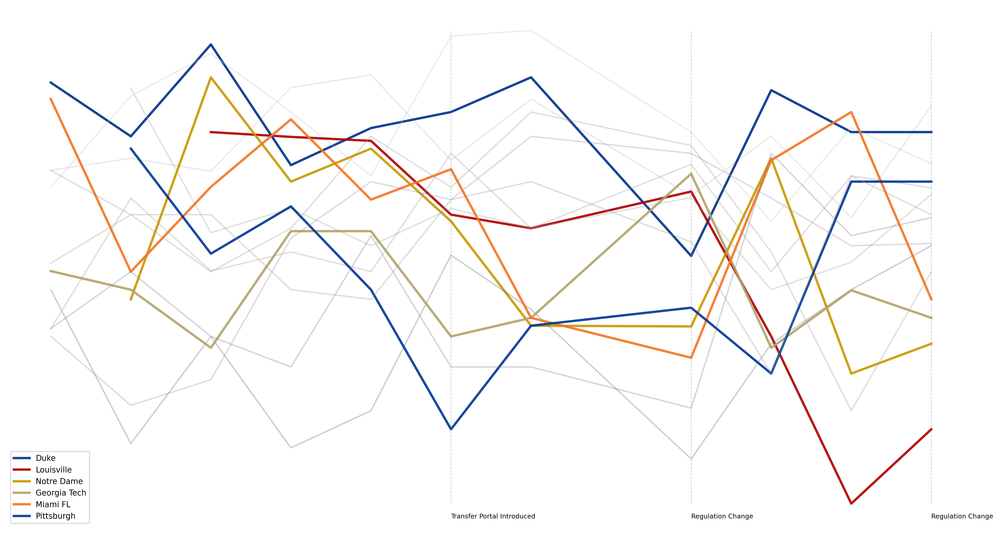

In [32]:
# Multiple Focus in one graph
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

focus_teams = ["Pittsburgh", "Miami FL", "Duke", "Notre Dame", "Louisville", "Georgia Tech"]

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team in focus_teams:
        ax.plot(x, y, label = team, alpha=0.9, color=get_color(team), lw=2.5)
    else:
        ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

bot, top = ax.get_ylim()
ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')
ax.set_axis_off()

plt.tight_layout()
plt.show()

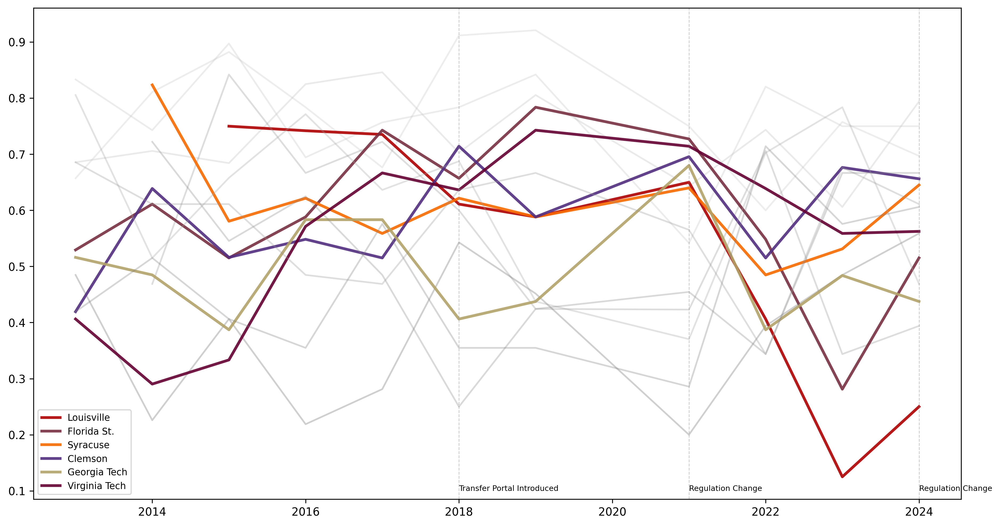

In [33]:
# Multiple Focus in one graph

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

focus_teams = ["Florida St.", "Georgia Tech", "Louisville", "Virginia Tech", "Clemson", "Syracuse"]

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team in focus_teams:
        ax.plot(x, y, label = team, alpha=0.9, color=get_color(team), lw=2.5)
    else:
        ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

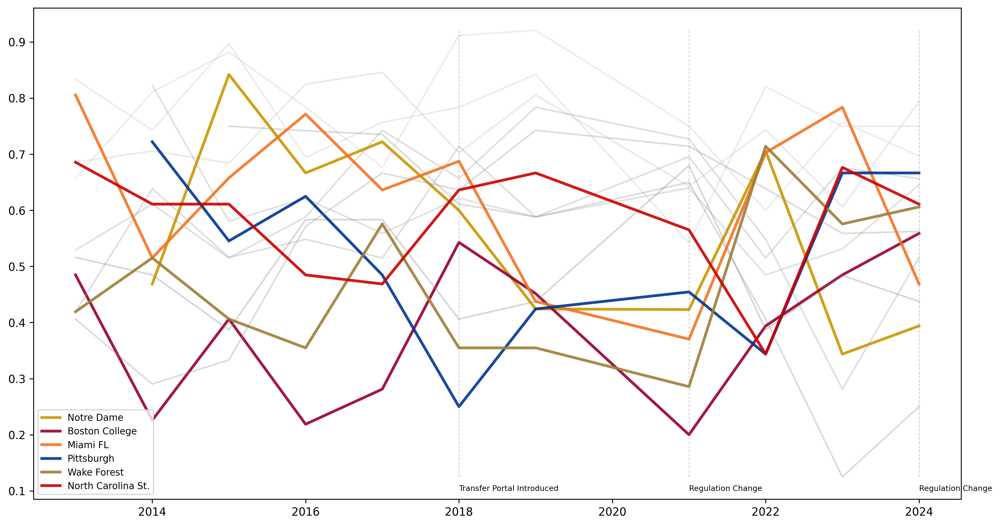

In [34]:
# Multiple Focus in one graph

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

focus_teams = ["Notre Dame", "Miami FL", "Wake Forest", "Pittsburgh", "Boston College", "North Carolina St."]

stat = 'WPRCT'
teams = acc["TEAM"].unique()

cmap = plt.colormaps['gray']

n = 0
for team in teams:
    team_stats = acc[acc['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    if team in focus_teams:
        ax.plot(x, y, label = team, alpha=0.9, color=get_color(team), lw=2.5)
    else:
        ax.plot(x, y, alpha=0.3, color=cmap(team_stats[stat].mean()))


bot, top = ax.get_ylim()
ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(acc[stat].min()-bot)/(top-bot), ymax=(acc[stat].max()-bot)/(top-bot))

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

# Conference Comparison

In [340]:
# Calculate Averages (WPRCT, BARTHAG, ALL STATS)
grouped_df = df.groupby(['CONF', 'YEAR'], as_index=False)
conf_mean_agg = grouped_df.agg({'WPRCT': 'mean', 'BARTHAG': 'mean', 'ADJOE': 'mean', 'ADJDE': 'mean', 'WAB': 'sum'})

In [341]:
conf_mean_agg['CONF'].unique()

array(['A10', 'ACC', 'AE', 'ASun', 'Amer', 'B10', 'B12', 'BE', 'BSky',
       'BSth', 'BW', 'CAA', 'CUSA', 'GWC', 'Horz', 'Ind', 'Ivy', 'MAAC',
       'MAC', 'MEAC', 'MVC', 'MWC', 'NEC', 'OVC', 'P12', 'Pat', 'SB',
       'SC', 'SEC', 'SWAC', 'Slnd', 'Sum', 'WAC', 'WCC', 'ind'],
      dtype=object)

In [342]:
confs = ["ACC", "SEC", "B10", "B12", "P12"]
power_five = conf_mean_agg[conf_mean_agg['CONF'].isin(confs)]
power_five

,CONF,YEAR,WPRCT,BARTHAG,ADJOE,ADJDE,WAB
11,ACC,2013,0.591725,0.763800,107.466667,95.383333,-20.00
12,ACC,2014,0.579846,0.792213,111.800000,97.886667,-4.00
13,ACC,2015,0.601028,0.819960,111.033333,94.826667,8.80
14,ACC,2016,0.605313,0.823093,113.506667,97.280000,11.20
15,ACC,2017,0.616713,0.844493,114.560000,96.913333,28.80
16,ACC,2018,0.607772,0.808033,112.273333,97.120000,6.70
17,ACC,2019,0.603778,0.805727,110.933333,95.140000,14.80
18,ACC,2021,0.556044,0.781467,109.540000,96.793333,-16.50
19,ACC,2022,0.556602,0.754367,109.560000,97.866667,-31.70
20,ACC,2023,0.553439,0.691947,109.786667,101.213333,-54.80


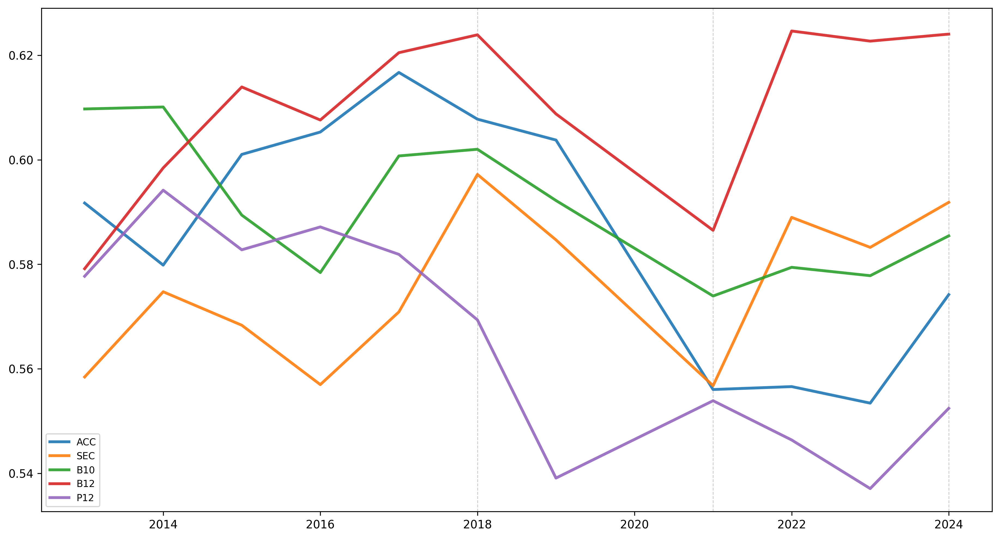

In [ ]:
# Power Five Conference Win Percentage Graphs

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'

cmap = plt.colormaps['tab10']

n = 0
for conf in confs:
    conf_stats = power_five[power_five['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    ax.plot(x, y, label = conf, color=cmap(n), alpha=0.9, lw=2.5)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

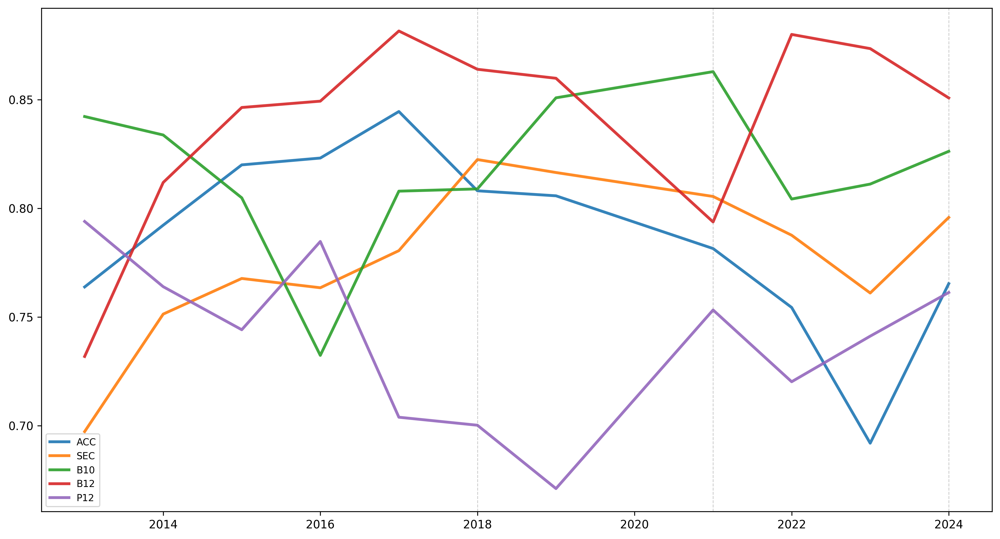

In [344]:
# Power Five Conference Barthag Graphs

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

focus_teams = ["Florida St.", "Georgia Tech", "Louisville", "Virginia Tech", "Clemson", "Syracuse"]

stat = 'BARTHAG'

cmap = plt.colormaps['tab10']

n = 0
for conf in confs:
    conf_stats = power_five[power_five['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    ax.plot(x, y, label = conf, color=cmap(n), alpha=0.9, lw=2.5)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

In [613]:
conf_median_agg = grouped_df.agg({'WPRCT': 'median', 'BARTHAG': 'median', 'ADJOE': 'median', 'ADJDE': 'median', 'WAB': 'sum'})
conf_mean_agg = grouped_df.agg({'WPRCT': 'mean', 'BARTHAG': 'mean', 'ADJOE': 'mean', 'ADJDE': 'mean', 'WAB': 'sum'})

In [614]:
conf_mean_agg['CONF'].unique()

array(['A10', 'ACC', 'AE', 'ASun', 'Amer', 'B10', 'B12', 'BE', 'BSky',
       'BSth', 'BW', 'CAA', 'CUSA', 'GWC', 'Horz', 'Ind', 'Ivy', 'MAAC',
       'MAC', 'MEAC', 'MVC', 'MWC', 'NEC', 'OVC', 'P12', 'Pat', 'SB',
       'SC', 'SEC', 'SWAC', 'Slnd', 'Sum', 'WAC', 'WCC', 'ind'],
      dtype=object)

In [615]:
confs = ["ACC", "SEC", "B10", "B12", "P12", "BE", "Amer"]
power_five = conf_mean_agg[conf_mean_agg['CONF'].isin(confs)]
power_five

,CONF,YEAR,WPRCT,BARTHAG,ADJOE,ADJDE,WAB
11,ACC,2013,0.591725,0.763800,107.466667,95.383333,-20.00
12,ACC,2014,0.579846,0.792213,111.800000,97.886667,-4.00
13,ACC,2015,0.601028,0.819960,111.033333,94.826667,8.80
14,ACC,2016,0.605313,0.823093,113.506667,97.280000,11.20
15,ACC,2017,0.616713,0.844493,114.560000,96.913333,28.80
...,...,...,...,...,...,...,...
292,SEC,2019,0.584674,0.816436,111.678571,96.078571,9.80
293,SEC,2021,0.556776,0.805429,108.892857,95.171429,-8.30
294,SEC,2022,0.588980,0.787593,108.650000,95.328571,-3.00
295,SEC,2023,0.583242,0.761014,110.050000,97.635714,-10.50


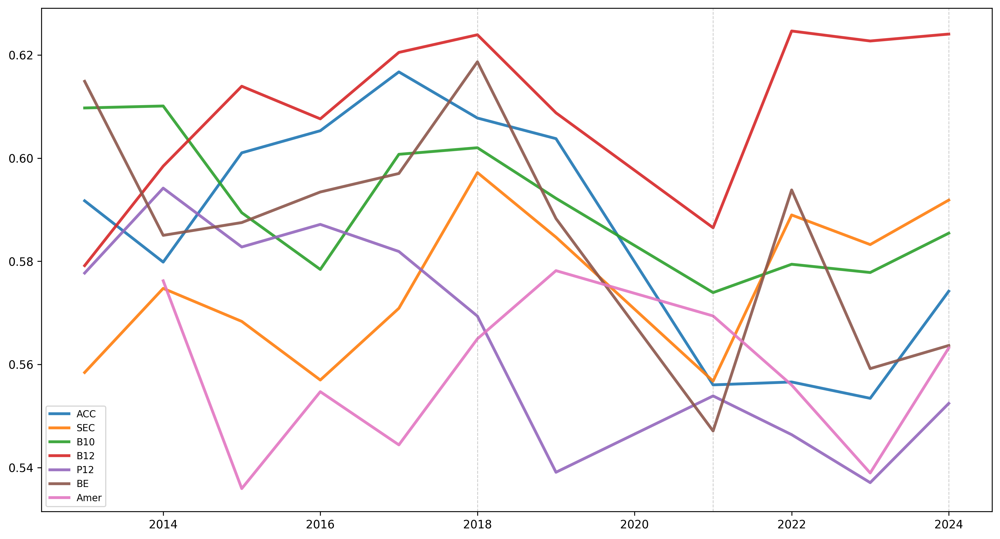

In [616]:
# Power Five Conference Win Percentage Graphs (Win Percentage is not a good judge for comparison between conferences)

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'WPRCT'

cmap = plt.colormaps['tab10']

n = 0
for conf in confs:
    conf_stats = power_five[power_five['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    ax.plot(x, y, label = conf, color=cmap(n), alpha=0.9, lw=2.5)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

Text(0.5, 1.0, 'ACC Power Rating Trend Over Other Conferences')

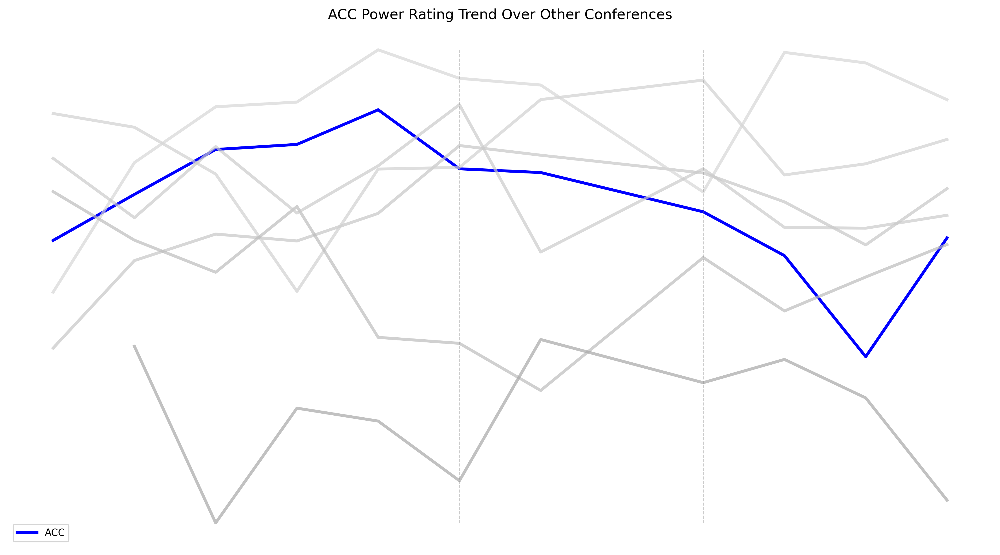

In [ ]:
# Power Five Conference BARTHAG Graphs

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'BARTHAG'

cmap = plt.colormaps['grey']

n = 0
for conf in confs:
    conf_stats = power_five[power_five['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    if(conf == 'ACC'):
        ax.plot(x, y, label = conf, color='blue', alpha=1, lw=2.5)
    else:
        ax.plot(x, y, color=cmap(conf_stats[stat].mean()), alpha=0.7, lw=2.5)
    n+=1



bot, top = ax.get_ylim()
ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(power_five[stat].min()-bot)/(top-bot), ymax=(power_five[stat].max()-bot)/(top-bot))
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4, ymin=(power_five[stat].min()-bot)/(top-bot), ymax=(power_five[stat].max()-bot)/(top-bot))

ax.legend(loc="lower left", fontsize='small')
ax.set_axis_off()

plt.title("ACC Power Rating Trend Over Other Conferences")

In [431]:
stat = 'BARTHAG'
vars = []


confs = conf_mean_agg["CONF"].unique()
for conf in confs:
    conf_stats = conf_mean_agg[conf_mean_agg['CONF'] == conf]
    vars.append(conf_stats[stat].max())

top_rating = pd.DataFrame({'CONF' : confs, 
                            stat : vars})

top_rating.sort_values('BARTHAG', ascending=False)

,CONF,BARTHAG
6,B12,0.881530
5,B10,0.862836
7,BE,0.847660
1,ACC,0.844493
28,SEC,0.822400
24,P12,0.793933
21,MWC,0.745689
0,A10,0.719838
4,Amer,0.702558
20,MVC,0.680820


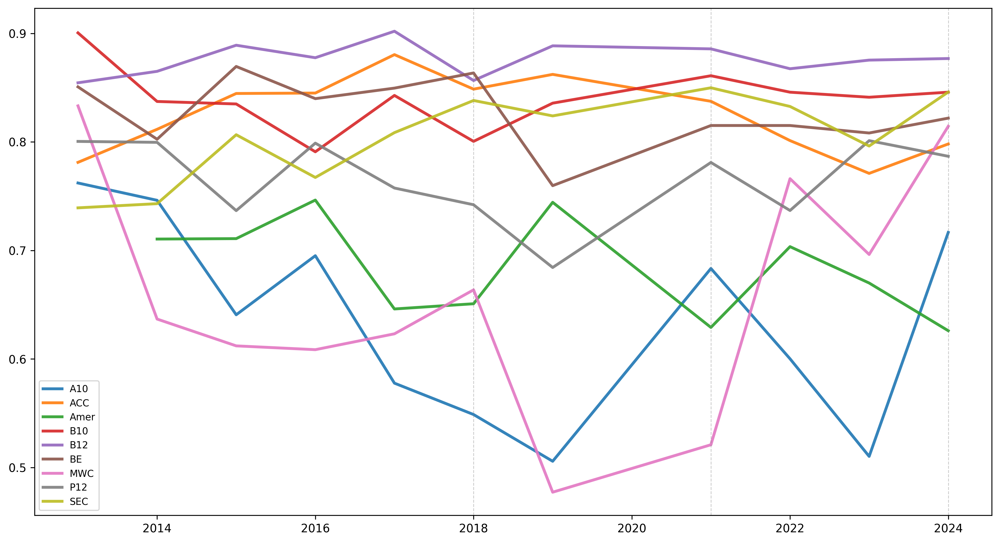

In [440]:
# More conferences (Not useful without transfer data)

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'BARTHAG'

cmap = plt.colormaps['tab10']
top_ten = top_rating[top_rating['BARTHAG'] >= 0.7]

confs = top_ten['CONF'].unique()

n = 0
for conf in confs:
    conf_stats = conf_median_agg[conf_mean_agg['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    ax.plot(x, y, label = conf, color=cmap(n), alpha=0.9, lw=2.5)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

In [434]:
df[df['CONF'] == 'MWC']['TEAM'].unique()

array(['Air Force', 'Colorado St.', 'Fresno St.', 'Nevada', 'New Mexico',
       'San Jose St.', 'UNLV', 'Utah St.', 'Boise St.', 'San Diego St.',
       'Wyoming'], dtype=object)

# Looking at NCAA Tournament Champions

In [ ]:
champions = df[df['POSTSEASON'] == "Champions"]
champions['TEAM']

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,...,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,0.897436
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,...,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,0.921053
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,...,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,0.846154
10,Villanova,BE,40,35,123.1,90.9,0.9703,56.1,46.7,16.3,...,57.4,44.1,36.2,33.9,66.7,8.9,Champions,2.0,2016,0.875000
11,Villanova,BE,40,36,128.4,94.1,0.9725,59.5,48.5,15.0,...,59.0,49.0,40.1,31.7,69.6,10.6,Champions,1.0,2018,0.900000
12,Connecticut,Amer,40,32,112.5,91.3,0.9171,51.5,44.6,17.3,...,48.1,42.2,38.7,33.0,64.8,4.7,Champions,7.0,2014,0.800000
13,Louisville,BE,40,35,115.9,84.5,0.9743,50.6,44.8,18.3,...,50.8,43.4,33.3,31.8,67.1,9.0,Champions,1.0,2013,0.875000
2456,Baylor,B12,24,22,123.2,94.5,0.9548,57.5,49.1,17.6,...,54.1,48.1,41.8,34.0,68.8,6.6,Champions,1.0,2021,0.916667
2803,Kansas,B12,40,34,119.8,91.3,0.9580,53.8,45.8,17.3,...,53.6,46.4,36.1,29.8,69.1,10.4,Champions,1.0,2022,0.850000
3172,Connecticut,BE,39,31,121.5,91.2,0.9643,53.9,44.4,18.9,...,53.6,44.4,36.3,29.7,66.7,5.0,Champions,4.0,2023,0.794872


In [400]:
champion_stats = df[df['TEAM'].isin(champions['TEAM'].unique())]
# champion_stats = champion_stats[champion_stats['TEAM'] != 'Louisville']
champion_stats

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,0.825000
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,...,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,0.897436
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,...,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,0.921053
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,...,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,0.846154
10,Villanova,BE,40,35,123.1,90.9,0.9703,56.1,46.7,16.3,...,57.4,44.1,36.2,33.9,66.7,8.9,Champions,2.0,2016,0.875000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3536,Duke,ACC,32,24,120.8,96.8,0.9272,55.2,49.0,14.3,...,54.4,49.1,37.7,32.6,66.9,3.3,E8,4.0,2024,0.750000
3538,Kansas,B12,31,22,113.5,92.7,0.9111,53.4,47.6,16.4,...,54.8,45.3,33.3,33.8,68.9,4.3,R32,4.0,2024,0.709677
3564,Virginia,ACC,33,23,104.6,92.0,0.8147,49.3,46.2,13.2,...,46.8,46.6,36.3,30.4,60.0,1.2,R68,10.0,2024,0.696970
3592,Villanova,BE,33,18,110.4,93.5,0.8710,50.7,48.2,14.5,...,50.4,47.6,34.0,32.7,63.3,-1.1,NaN,NaN,2024,0.545455


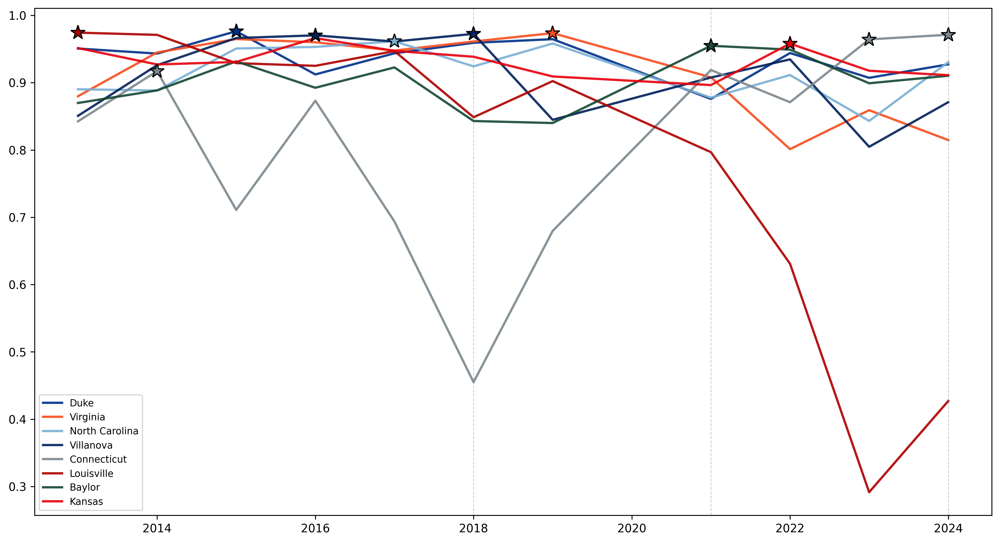

In [401]:
fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'BARTHAG'

teams = champions['TEAM'].unique()

cmap = plt.colormaps['tab10']

n = 0
for team in teams:
    team_stats = champion_stats[champion_stats['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    x = team_stats['YEAR']
    y = team_stats[stat]
    ax.plot(x, y, label = team, color=get_color(team), alpha=0.9, lw=2)
    n+=1

n=0
for team in teams:
    team_stats = champion_stats[champion_stats['TEAM'] == team]
    team_stats = team_stats.sort_values('YEAR')
    for index, row in team_stats.iterrows():
            if row['POSTSEASON'] == 'Champions':
                x = row['YEAR']
                y = row[stat]
                ax.plot(x, y, marker='*', color=get_color(team), markeredgecolor='black', ms=13)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')

In [454]:
champion_stats

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,WPRCT
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,0.825000
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,...,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,0.897436
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,...,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,0.921053
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,...,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,0.846154
10,Villanova,BE,40,35,123.1,90.9,0.9703,56.1,46.7,16.3,...,57.4,44.1,36.2,33.9,66.7,8.9,Champions,2.0,2016,0.875000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3536,Duke,ACC,32,24,120.8,96.8,0.9272,55.2,49.0,14.3,...,54.4,49.1,37.7,32.6,66.9,3.3,E8,4.0,2024,0.750000
3538,Kansas,B12,31,22,113.5,92.7,0.9111,53.4,47.6,16.4,...,54.8,45.3,33.3,33.8,68.9,4.3,R32,4.0,2024,0.709677
3564,Virginia,ACC,33,23,104.6,92.0,0.8147,49.3,46.2,13.2,...,46.8,46.6,36.3,30.4,60.0,1.2,R68,10.0,2024,0.696970
3592,Villanova,BE,33,18,110.4,93.5,0.8710,50.7,48.2,14.5,...,50.4,47.6,34.0,32.7,63.3,-1.1,NaN,NaN,2024,0.545455


In [456]:
confs

['ACC', 'SEC', 'B10', 'B12', 'P12', 'BE', 'Amer']

             TEAM CONF   G   W  ADJOE  ADJDE  BARTHAG  EFG_O  EFG_D   TOR  \
7            Duke  ACC  39  35  125.2   90.6   0.9764   56.6   46.5  16.3   
8        Virginia  ACC  38  35  123.0   89.9   0.9736   55.2   44.7  14.7   
9  North Carolina  ACC  39  33  121.0   91.5   0.9615   51.7   48.1  16.2   

   ...  2P_O  2P_D  3P_O  3P_D  ADJ_T   WAB  POSTSEASON  SEED  YEAR     WPRCT  
7  ...  55.9  46.3  38.7  31.4   66.4  10.7   Champions   1.0  2015  0.897436  
8  ...  52.5  45.7  39.5  28.9   60.7  11.1   Champions   1.0  2019  0.921053  
9  ...  51.0  46.3  35.5  33.9   72.8   8.4   Champions   1.0  2017  0.846154  

[3 rows x 25 columns]
Empty DataFrame
Columns: [TEAM, CONF, G, W, ADJOE, ADJDE, BARTHAG, EFG_O, EFG_D, TOR, TORD, ORB, DRB, FTR, FTRD, 2P_O, 2P_D, 3P_O, 3P_D, ADJ_T, WAB, POSTSEASON, SEED, YEAR, WPRCT]
Index: []

[0 rows x 25 columns]
Empty DataFrame
Columns: [TEAM, CONF, G, W, ADJOE, ADJDE, BARTHAG, EFG_O, EFG_D, TOR, TORD, ORB, DRB, FTR, FTRD, 2P_O, 2P_D, 3P_O, 3P_D

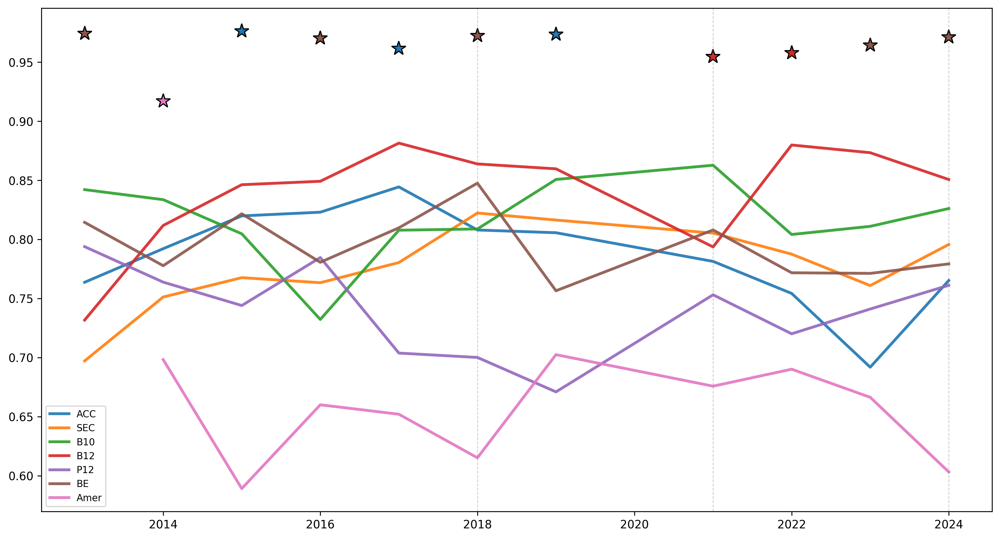

In [474]:
# Top Conferences with champions marked # Power Five Conference BARTHAG Graphs

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

stat = 'BARTHAG'

cmap = plt.colormaps['tab10']

n = 0
for conf in confs:
    conf_stats = power_five[power_five['CONF'] == conf]
    conf_stats = conf_stats.sort_values('YEAR')
    x = conf_stats['YEAR']
    y = conf_stats[stat]
    ax.plot(x, y, label = conf, color=cmap(n), alpha=0.9, lw=2.5)
    n+=1

n=0
for conf in confs:
    conf_champs = champion_stats[champion_stats['CONF'] == conf]
    conf_champs = conf_champs[conf_champs['POSTSEASON'] == 'Champions']
    print(conf_champs)
    for index, row in conf_champs.iterrows():
        x = row['YEAR']
        # need to get conf average barthag from conf_mean_agg rather and use as y
        y = row[stat]
        ax.plot(x, y, marker='*', color=cmap(n), markeredgecolor='black', ms=13)
    n+=1

ax.axvline(2018, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2021, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)
ax.axvline(2024, color="gray", linestyle="--", linewidth=0.7, alpha=0.4)

ax.annotate("Transfer Portal Introduced", xy=(2018, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2021, 0.1), fontsize='x-small')
ax.annotate("Regulation Change", xy=(2024, 0.1), fontsize='x-small')

ax.legend(loc="lower left", fontsize='small')